# TIAToolbox Hands‑On: Mini End‑to‑End Computational Pathology

In this session, you will explore the fundamentals of handling whole-slide images (WSIs), extracting patches, performing stain normalisation, and using deep learning models (ie, HoVer-Net) for tissue and nuclei analysis using the [TIAToolbox](https://github.com/TissueImageAnalytics/tiatoolbox).

Keep a tab open for [the documentation](https://tia-toolbox.readthedocs.io/en/latest/index.html), such that you can easily access it to help you solve each question.

Before starting, remember to already save this notebook in your own account to be able to save your progress.

And don't forget to select the runtime type to T4 GPU.


## Environment setup


In [1]:
# Install some system-level required packages
!apt-get -y install libopenjp2-7-dev libopenjp2-tools

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libopenjp2-7-dev is already the newest version (2.4.0-6ubuntu0.4).
libopenjp2-7-dev set to manually installed.
The following NEW packages will be installed:
  libopenjp2-tools
0 upgraded, 1 newly installed, 0 to remove and 37 not upgraded.
Need to get 77.8 kB of archives.
After this operation, 250 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 libopenjp2-tools amd64 2.4.0-6ubuntu0.4 [77.8 kB]
Fetched 77.8 kB in 0s (206 kB/s)
Selecting previously unselected package libopenjp2-tools.
(Reading database ... 121852 files and directories currently installed.)
Preparing to unpack .../libopenjp2-tools_2.4.0-6ubuntu0.4_amd64.deb ...
Unpacking libopenjp2-tools (2.4.0-6ubuntu0.4) ...
Setting up libopenjp2-tools (2.4.0-6ubuntu0.4) ...
Processing triggers for man-db (2.10.2-1) ...


In [2]:
# Install TIA Toolbox and OpenSlide (it might take a few minutes)
# Need to specify a specific version of numcodecs because of dependency issue
!pip install tiatoolbox openslide-bin numcodecs==0.12.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.9/43.9 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.6/51.6 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of opencv-python-headless to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of typer to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 55.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 37.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 109.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━

Execute the cell below just with imports and utility functions which we will use later.

In [ ]:
import os
from pathlib import Path
from pprint import pprint

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from tiatoolbox.utils.misc import download_data, select_device
from tiatoolbox.utils import imread, imwrite
from tiatoolbox.wsicore.wsireader import WSIReader
from tiatoolbox.tools import patchextraction
from tiatoolbox.tools.stainnorm import MacenkoNormalizer
from tiatoolbox.data import small_svs, stain_norm_target

from tiatoolbox.utils.visualization import overlay_prediction_mask, overlay_prediction_contours

# Reproducibility (within reason)
rng = np.random.default_rng(0)

mpl.rcParams["figure.dpi"] = 150
mpl.rcParams["figure.facecolor"] = "white"
plt.rcParams.update({"font.size": 9})

def show_side_by_side(img1, img2, titles=("A", "B"), figsize=(9, 4)):
    fig, axs = plt.subplots(1, 2, figsize=figsize)
    axs[0].imshow(img1); axs[0].set_title(titles[0]); axs[0].axis("off")
    axs[1].imshow(img2); axs[1].set_title(titles[1]); axs[1].axis("off")
    plt.show()

def show_grid(patches, n=16, title="Patches", figsize=(8, 8)):
    n = min(n, len(patches))
    k = int(np.ceil(np.sqrt(n)))
    fig, axs = plt.subplots(k, k, figsize=figsize)
    fig.suptitle(title)
    axs = np.array(axs).reshape(-1)
    for i in range(k*k):
        axs[i].axis("off")
        if i < n:
            axs[i].imshow(patches[i])
    plt.show()

device = 'cuda' # Just use 'cpu' if you are not using a runtime with GPU

  check_for_updates()



You will now download a region of a WSI (rather than an entire WSI) to ensure you don't hit Colab's limits.

If you want to explore this notebook even faster, notice that commented lines with code to get an even smaller WSI.

In [ ]:
data_dir = Path("data")
data_dir.mkdir(exist_ok=True)

# Small WSI
# wsi_small_path = Path(small_svs())
# print("Small WSI:", wsi_small_path, "size(MB)=", wsi_small_path.stat().st_size / 1e6)

# "Moderate" WSI (Colab-friendly)
wsi_med_path = Path(download_data(
    "https://tiatoolbox.dcs.warwick.ac.uk/sample_wsis/wsi4_12k_12k.svs",
    data_dir / "wsi4_12k_12k.svs",
))
print("Moderate WSI:", wsi_med_path, "size(MB)=", wsi_med_path.stat().st_size / 1e6)


Moderate WSI: data/wsi4_12k_12k.svs size(MB)= 18.785787
TCGA tile: data/TCGA-HE-7130-01Z-00-DX1.png size(MB)= 2.012204


## WSI loading and visualisation


We can open a WSI image using `WSIReader.open()`. Have a closer look to the information in the `info_dict` object below - does it make sense?

In [ ]:
wsi = WSIReader.open(wsi_med_path)

info_dict = wsi.info.as_dict()
pprint(info_dict)

{'axes': 'YXS',
 'file_path': PosixPath('data/wsi4_12k_12k.svs'),
 'level_count': 2,
 'level_dimensions': ((12000, 12000), (3000, 3000)),
 'level_downsamples': [1.0, 4.0],
 'mpp': (0.2505, 0.2505),
 'objective_power': 40.0,
 'slide_dimensions': (12000, 12000),
 'vendor': 'aperio'}


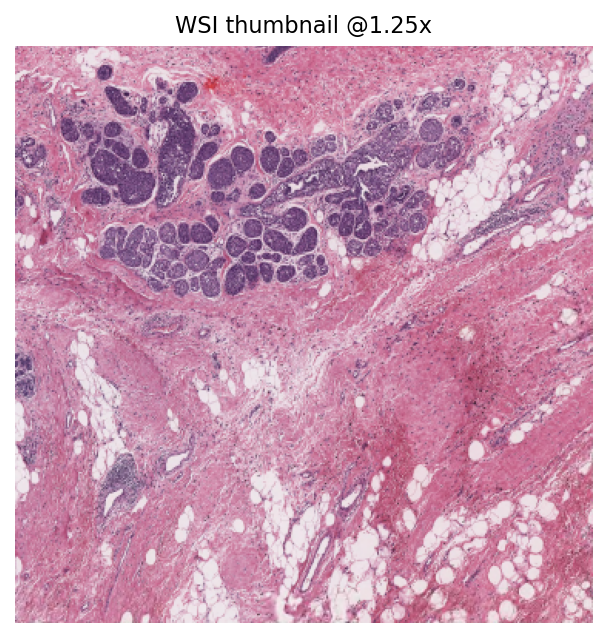

In [ ]:
# Use `slide_thumbnail()` to visualise the WSI image. Notice the different ways
#  to read the image

thumb = wsi.slide_thumbnail(resolution=1.25, units="power")
#thumb = wsi.slide_thumbnail(resolution=0.5, units="mpp") # 0.5 microns per-pixel
#thumb = wsi.slide_thumbnail(resolution=0, units="level") # level 0 at the pyramid layer (highest resolution)
plt.figure(figsize=(6,5))
plt.imshow(thumb)
plt.title("WSI thumbnail @1.25x")
plt.axis("off")
plt.show()

In [ ]:
# Sanity checking the shape of the returned image
# Check this shape every time you run `slide_thumbnail()` with different parameters.
thumb.shape

(375, 375, 3)

### Exercise

Using `mpp` and `slide_dimensions`, estimate the physical slide size in **mm** (width × height).

**Tip:** `mpp` is µm per pixel, and 1000 µm = 1 mm.

In [ ]:
# TODO: Compute the physical size in mm (w, h) here

In [ ]:
# Solution, notice mpp and slide_dimensions are for highest resolution
mpp_x, mpp_y = info_dict["mpp"]
w_px, h_px = info_dict["slide_dimensions"] # number of pixels
w_mm = (w_px * mpp_x) / 1000.0
h_mm = (h_px * mpp_y) / 1000.0
print(f"Approx physical size: {w_mm:.2f} mm × {h_mm:.2f} mm")

Approx physical size: 3.01 mm × 3.01 mm


### Exercise
Use the function `read_rect()` to select a region of the WSI at 20x and 5x magnification.

The starting coordinates and size are already provided, and you can use the utility function `show_side_by_side()` to see both ROIs. ROI stands for Region of Interest.



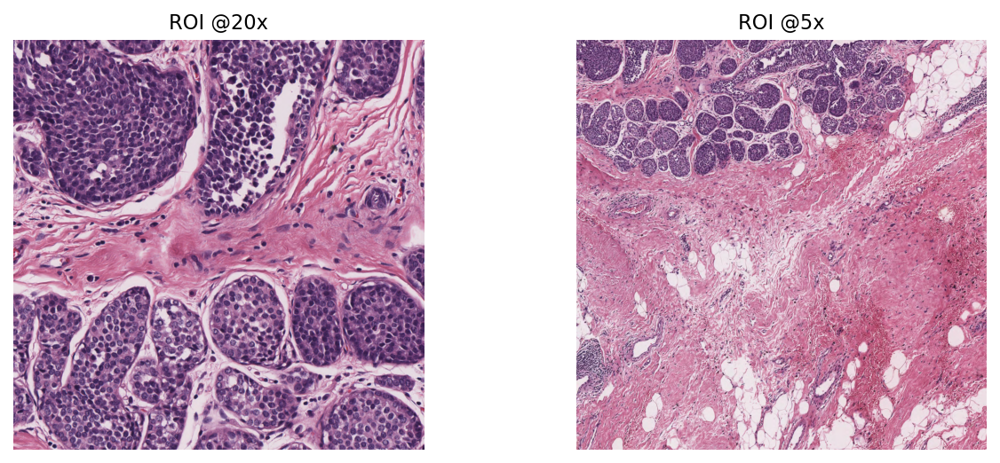

In [ ]:
roi_xy = (2000, 2500)      # top-left (x, y)
roi_size = (1024, 1024)    # (width, height) output size

# TODO: Do the rest of the exercise here

roi_20x = wsi.read_rect(roi_xy, roi_size, resolution=20, units="power")
roi_5x  = wsi.read_rect(roi_xy, roi_size, resolution=5, units="power")

show_side_by_side(roi_20x, roi_5x, titles=("ROI @20x", "ROI @5x"), figsize=(10,4))

### Exercise

Tweak coordinates to find two different ROIs: one with more nuclei, and another with more connectivity tissue. Do you remember how they should look like?


In [ ]:
# TODO: define roi_xy_A, roi_xy_B and visualise at 20x vs 5x
roi_xy_A = (, )
roi_xy_B = (, )

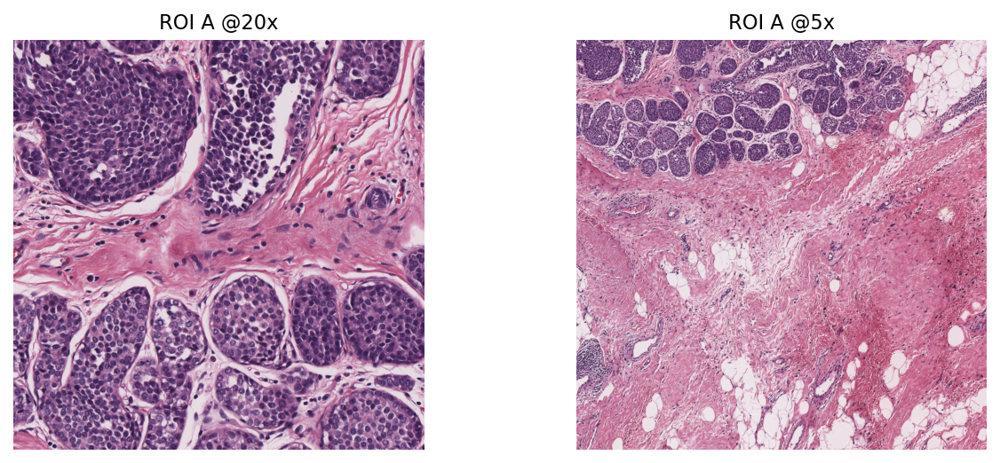

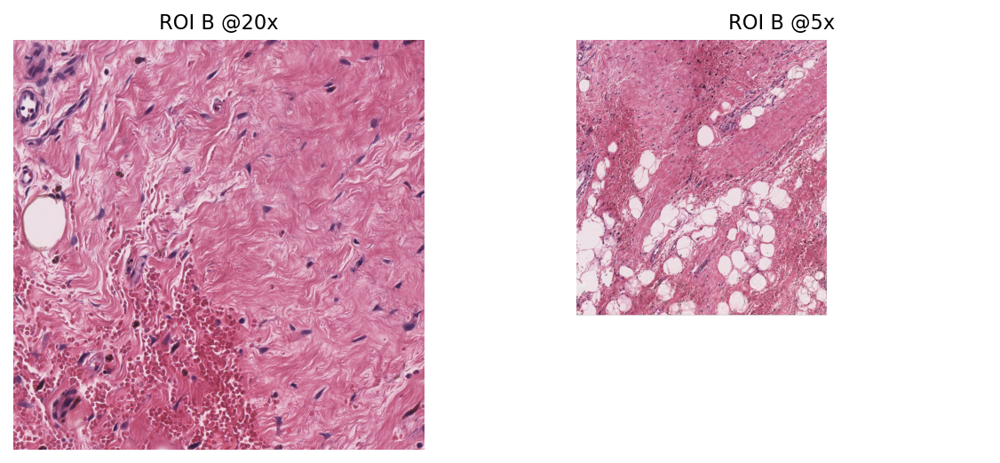

In [ ]:
# Solution
roi_xy_A = (2000, 2500)
roi_xy_B = (7000, 6500)

for name, xy in [("A", roi_xy_A), ("B", roi_xy_B)]:
    a20 = wsi.read_rect(xy, roi_size, resolution=20, units="power")
    a5  = wsi.read_rect(xy, roi_size, resolution=5, units="power")
    show_side_by_side(a20, a5, titles=(f"ROI {name} @20x", f"ROI {name} @5x"), figsize=(10,4))

## Patch extraction

TIAToolbox offers `tissue_mask()` for quick detection/masking of regions that are not "glass"/background, such that you don't select patches that only contain background.

Below here you can see it practice.



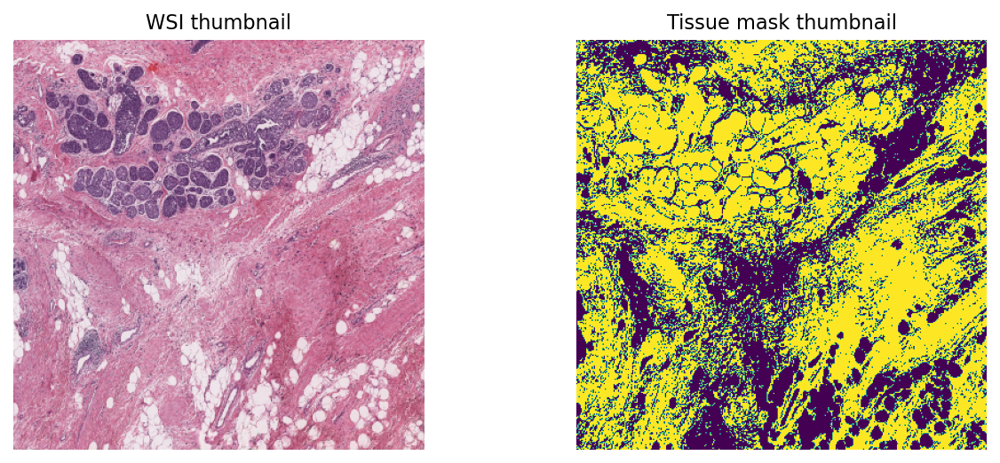

In [ ]:
mask_reader = wsi.tissue_mask(resolution=1.25, units="power")
mask_thumb = mask_reader.slide_thumbnail(resolution=1.25, units="power")

show_side_by_side(thumb, mask_thumb, titles=("WSI thumbnail", "Tissue mask thumbnail"), figsize=(10,4))

### Exercise

Compute the fraction of pixels flagged as tissue in the mask of the `thumb` object.


In [ ]:
# TODO: compute tissue fraction here

dtype('uint8')

In [ ]:
# Solution
if mask_thumb.ndim == 3:
    tissue_frac = (mask_thumb[..., 0] > 0).mean()
else:
    tissue_frac = (mask_thumb > 0).mean()
print(f"Tissue fraction at thumbnail scale: {tissue_frac:.3f}")

Tissue fraction at thumbnail scale: 0.595


### Exercise

Using the function [`patchextraction.get_patch_extractor()`](https://tia-toolbox.readthedocs.io/en/latest/_autosummary/tiatoolbox.tools.patchextraction.get_patch_extractor.html#tiatoolbox.tools.patchextraction.get_patch_extractor), extract patches of size (224, 224). Notice the ** kwargs** parameter that will be passed to `PatchExtractor`.

You can use the utility function `show_grid()` to check the patches extracted.


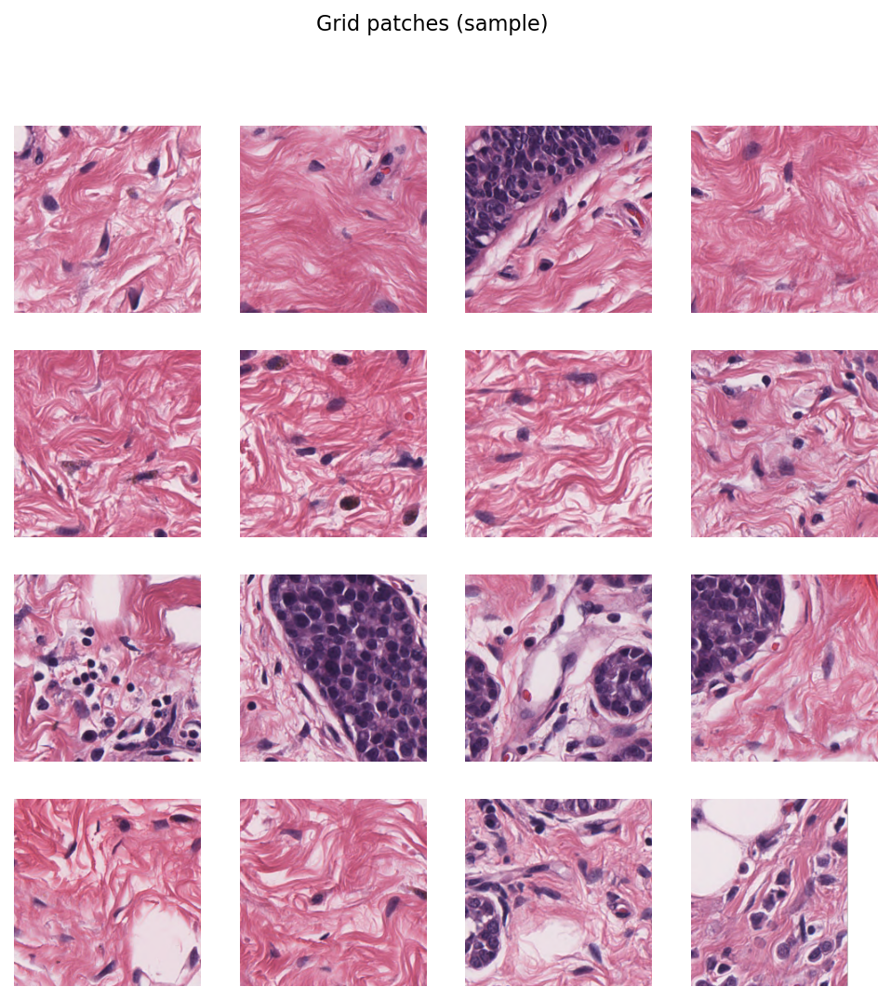

Shown 16 grid patches


In [ ]:
patch_size = (224, 224)
patch_res = 0.5
patch_units = "mpp"
grid_patches = [] # Where you'll save the extracted patches to use later

# TODO: Complete exercise here

# GRID extraction (coarse stride to keep runtime reasonable)
grid_stride = (448, 448)
grid_extractor = patchextraction.get_patch_extractor(
    input_img=wsi,
    method_name="slidingwindow",
    patch_size=patch_size,
    stride=grid_stride,
    resolution=patch_res,
    units=patch_units,
    input_mask=mask_reader,
    min_mask_ratio=0.5,
)


for i, p in enumerate(grid_extractor):
    grid_patches.append(p)
    if i >= 15:
        break

show_grid(grid_patches, n=16, title="Grid patches (sample)")
print("Shown", len(grid_patches), "grid patches")

## Stain normalisation

In the code below you will get a stained image to serve as our `target` image to run the Macenko algorithm on.

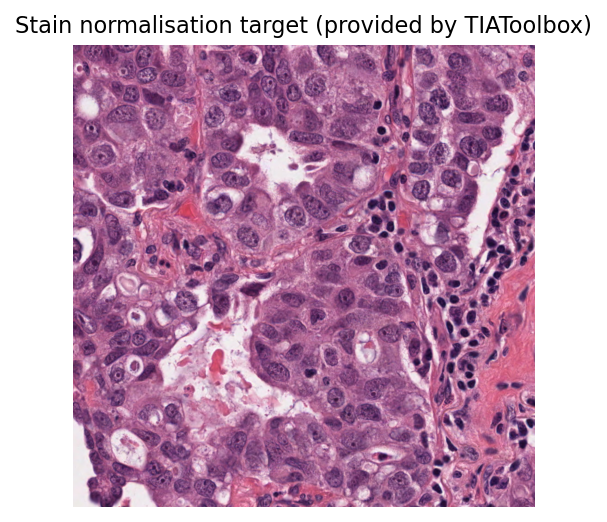

Macenko normaliser fitted.


In [ ]:
target_img = stain_norm_target()
plt.figure(figsize=(4,4))
plt.imshow(target_img)
plt.title("Stain normalisation target (provided by TIAToolbox)")
plt.axis("off")
plt.show()

norm = MacenkoNormalizer()
norm.fit(target_img)
print("Macenko normaliser fitted.")

### Exercise

Transform the patches you previously extracted to `grid_patches` using the Macenko normalisation, and plot each one before and after. You can use the utility function `show_side_by_side()` to help.

**Tip:** Normalise and visualise only 4 patches for now, such that you cna go quicker to the following exercises.

In [ ]:
norm_patches = [] # Where you'll save the normalised images

# TODO: normalise the images in `grid_patches`

src_patches = grid_patches[:4] if len(grid_patches) >= 4 else [roi_20x[:224, :224]]
norm_patches = [norm.transform(p.astype(np.uint8)) for p in src_patches]

for i in range(len(src_patches)):
    show_side_by_side(src_patches[i], norm_patches[i], titles=(f"Before #{i}", f"After #{i}"), figsize=(8,4))

Output hidden; open in https://colab.research.google.com to view.

### Exercise

Compute per‑channel statistics (mean/std in RGB) before vs after normalisation for 10 patches in `grid_patches`.

In [ ]:
# TODO: compute RGB mean/std before vs after for a batch of patches here

In [ ]:
# Solution (remove for students)
sample = grid_patches[:10]
rows = []
for i, p in enumerate(sample):
    q = norm.transform(p.astype(np.uint8))
    rows.append({
        "i": i,
        "R_mean_before": p[...,0].mean(), "G_mean_before": p[...,1].mean(), "B_mean_before": p[...,2].mean(),
        "R_std_before":  p[...,0].std(),  "G_std_before":  p[...,1].std(),  "B_std_before":  p[...,2].std(),
        "R_mean_after":  q[...,0].mean(), "G_mean_after":  q[...,1].mean(), "B_mean_after":  q[...,2].mean(),
        "R_std_after":   q[...,0].std(),  "G_std_after":   q[...,1].std(),  "B_std_after":   q[...,2].std(),
    })
df_rgb = pd.DataFrame(rows)
display(df_rgb.head())

,i,R_mean_before,G_mean_before,B_mean_before,R_std_before,G_std_before,B_std_before,R_mean_after,G_mean_after,B_mean_after,R_std_after,G_std_after,B_std_after
0,0,208.809491,142.287089,172.840900,28.768995,38.964458,30.350914,189.262018,121.442104,161.309012,35.524108,42.901195,34.158466
1,1,202.847457,121.831274,157.810627,21.455230,27.081906,22.605617,182.906390,106.555624,149.790298,30.959426,29.794176,25.006962
2,2,170.712392,112.848713,150.924346,55.503400,49.966482,39.590322,171.856027,109.193758,150.721799,56.161344,51.618058,41.668233
3,3,206.136380,124.950773,159.953225,19.577047,28.624717,23.462818,167.696927,95.085360,140.739357,31.861291,32.184224,27.300565
4,4,205.581593,125.466179,158.969228,25.210346,36.853752,29.983549,170.530254,101.521026,145.568917,36.561783,41.246397,33.691699


## Nuclei instance segmentation using HoVer‑Net

We’ll run TIAToolbox’s pretrained HoVer‑Net via `NucleusInstanceSegmentor` on a single ROI which you can extract from the `wsi` object, not the full slide.

**Runtime tip:** If you are using CPU runtime, keep ROI modest by changing the size of the ROI and resolution.

**Suggestion:** Use `pretrained_model="hovernet_fast-pannuke"`

In [ ]:
from tiatoolbox.models.engine.nucleus_instance_segmentor import NucleusInstanceSegmentor
import joblib

roi_for_hover = wsi.read_rect(roi_xy, (1024, 1024), resolution=20, units="power")

# TODO: Run nuclei segmentation here

# Extract an ROI and save as a tile for tile-mode inference
roi_tile_path = data_dir / "roi_for_hovernet.png"
imwrite(roi_tile_path, roi_for_hover)

inst_segmentor = NucleusInstanceSegmentor(
    pretrained_model="hovernet_fast-pannuke",
    num_loader_workers=0,
    num_postproc_workers=0,
    batch_size=4,
)

hover_out = inst_segmentor.predict(
    [str(roi_tile_path)],
    save_dir=str(data_dir / "hovernet_roi_result"),
    mode="tile",
    device=device,
    crash_on_exception=True,
)
print("HoVer-Net output pointer:", hover_out)

  saved_state_dict = torch.load(pretrained_weights, map_location="cpu")

Process Batch: 100%|##############################| 3/3 [00:01<00:00,  2.62it/s]


HoVer-Net output pointer: [['data/roi_for_hovernet.png', '/content/data/hovernet_roi_result/0']]


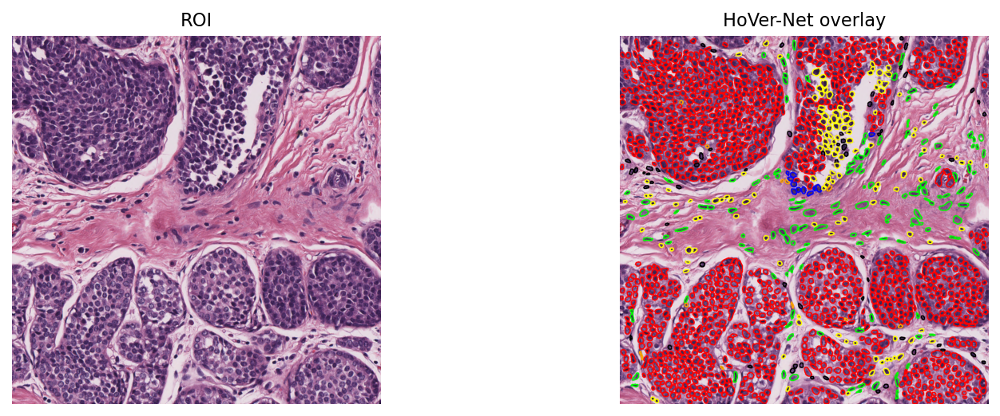

Detected nuclei: 1695


In [ ]:
# Assuming the output of your instance segmentor's predict() was saved in a
#  variable named `hover_out`, you can use the following code to visualise the
#  predicted output.
tile_preds = joblib.load(f"{hover_out[0][1]}.dat")

color_dict = {
    0: ("background", (255, 165, 0)),
    1: ("neoplastic epithelial", (255, 0, 0)),
    2: ("Inflammatory", (255, 255, 0)),
    3: ("Connective", (0, 255, 0)),
    4: ("Dead", (0, 0, 0)),
    5: ("non-neoplastic epithelial", (0, 0, 255)),
}

overlay = overlay_prediction_contours(
    canvas=roi_for_hover,
    inst_dict=tile_preds,
    draw_dot=False,
    type_colours=color_dict,
    line_thickness=2,
)

show_side_by_side(roi_for_hover, overlay, titles=("ROI", "HoVer-Net overlay"), figsize=(12,4))
print("Detected nuclei:", len(tile_preds))

### Exercise

Choose a different ROI and rerun HoVer‑Net. Also play a bit with the `line_thickness` and `draw_dot` parameters in  `overlay_prediction_contours()`.

**Suggestion:** Use the previous ROI you found that has more connective tissue, to see the differences.

In [ ]:
# TODO: rerun on a new ROI and summarise nucleus type counts here

Process Batch: 100%|##############################| 1/1 [00:00<00:00,  1.79it/s]
  marker = remove_small_objects(marker, min_size=obj_size)

Process Batch:   0%|                                     | 0/13 [01:11<?, ?it/s]


,count
1,7
2,24
3,127
4,9


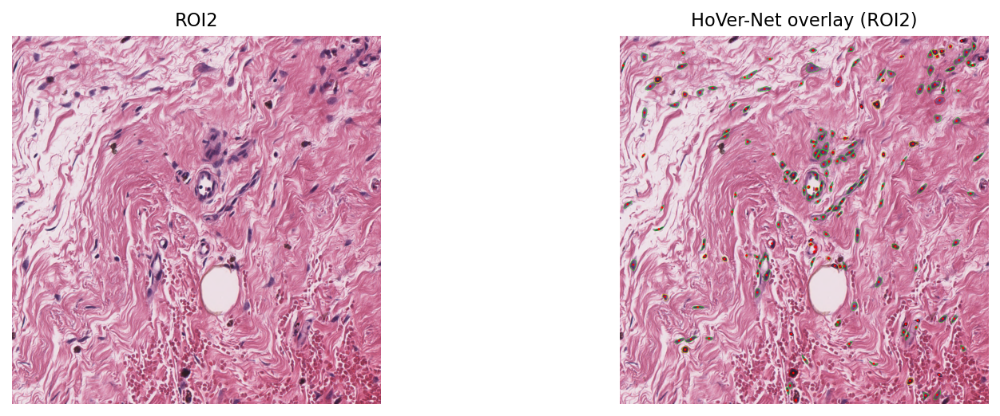

In [ ]:
# Solution
roi_xy2 = (6000, 6000)
roi2 = wsi.read_rect(roi_xy2, (1024, 1024), resolution=20, units="power")


roi2_path = data_dir / "roi2_for_hovernet.png"
imwrite(roi2_path, roi2)

hover_out2 = inst_segmentor.predict(
    [str(roi2_path)],
    save_dir=str(data_dir / "hovernet_roi2_results"),
    mode="tile",
    device=device,
    crash_on_exception=True,
)
preds2 = joblib.load(f"{hover_out2[0][1]}.dat")

type_ids = [v["type"] for v in preds2.values()]
counts = pd.Series(type_ids).value_counts().sort_index()
display(counts)

overlay2 = overlay_prediction_contours(
    canvas=roi2,
    inst_dict=preds2,
    draw_dot=True,
    type_colours=color_dict,
    line_thickness=1,
)
show_side_by_side(roi2, overlay2, titles=("ROI2", "HoVer-Net overlay (ROI2)"), figsize=(12,4))

## Morphological features

The following code can be used to compute per-nucleus morphology information, specifically area, eccentricity, and equivalent diameter.

It already calculates this information for the previous Hover-Net predictions that were stored in the `tile_preds` variable.


In [ ]:
from skimage.draw import polygon
from skimage.measure import regionprops

def inst_dict_to_features(inst_dict, canvas_shape):
    feats = []
    for nuc_id, nuc in inst_dict.items():
        contour = np.asarray(nuc["contour"], dtype=np.int32)  # (N,2) in x,y
        if contour.ndim != 2 or contour.shape[0] < 3:
            continue

        x, y, w_, h_ = nuc["box"]
        x0, y0 = max(0, x), max(0, y)
        x1, y1 = min(canvas_shape[1], x + w_), min(canvas_shape[0], y + h_)
        if x1 <= x0 or y1 <= y0:
            continue

        cx = contour[:, 0] - x0
        cy = contour[:, 1] - y0
        rr, cc = polygon(cy, cx, shape=(y1 - y0, x1 - x0))
        mask = np.zeros((y1 - y0, x1 - x0), dtype=np.uint8)
        mask[rr, cc] = 1

        props = regionprops(mask)
        if not props:
            continue
        p = props[0]

        feats.append({
            "nuc_id": nuc_id,
            "type": nuc["type"],
            "area_px2": float(p.area),
            "eccentricity": float(p.eccentricity),
            "equiv_diameter": float(p.equivalent_diameter),
            "centroid_x": float(nuc["centroid"][0]),
            "centroid_y": float(nuc["centroid"][1]),
        })
    return pd.DataFrame(feats)

df_feat = inst_dict_to_features(tile_preds, roi_for_hover.shape[:2])
display(df_feat.head())
print("Nuclei with features:", len(df_feat), "/", len(tile_preds))

,nuc_id,type,area_px2,eccentricity,equiv_diameter,centroid_x,centroid_y
0,930a7105b30b47959e2cda6286cebc3f,4,82.0,0.464176,10.217908,781.548780,6.463415
1,0e5f32cbd35f47cbb0fe08f7b5310f81,1,229.0,0.807612,17.075475,505.218341,8.663755
2,389a8108c7e8483292255daed248ed20,1,96.0,0.666151,11.055813,643.520833,7.395833
3,56ba31726061423f8d1d3ad5825057d0,1,207.0,0.297894,16.234549,743.855072,11.111111
4,087790fcbeca454b865715b62a7d5b7b,1,141.0,0.546517,13.398760,610.248227,11.673759


Nuclei with features: 1695 / 1695


### Exercise

Run HoVer-Net on stain-normalised ROI (use the `roi_for_hover` variable you defined before), and use the `inst_dict_to_features()` function to compare the morphological features before and after normalisation.

In [ ]:
# TODO: Run HoVer-Net on stain-normalised ROI and check the morphological features here
# TODO: Plot the distributions to more easily visualise the differences

roi_norm = norm.transform(roi_for_hover.astype(np.uint8))
roi_norm_path = data_dir / "roi_for_hovernet_norm.png"
imwrite(roi_norm_path, roi_norm)

hover_out_norm = inst_segmentor.predict(
    [str(roi_norm_path)],
    save_dir=str(data_dir / "hovernet_roi_norm_results"),
    mode="tile",
    device=device,
    crash_on_exception=True,
)
preds_norm = joblib.load(f"{hover_out_norm[0][1]}.dat")

df_feat_norm = inst_dict_to_features(preds_norm, roi_norm.shape[:2])
print("Original feats:", len(df_feat), " Normalised feats:", len(df_feat_norm))

Process Batch: 100%|##############################| 3/3 [00:01<00:00,  2.43it/s]


Original feats: 1695  Normalised feats: 1702


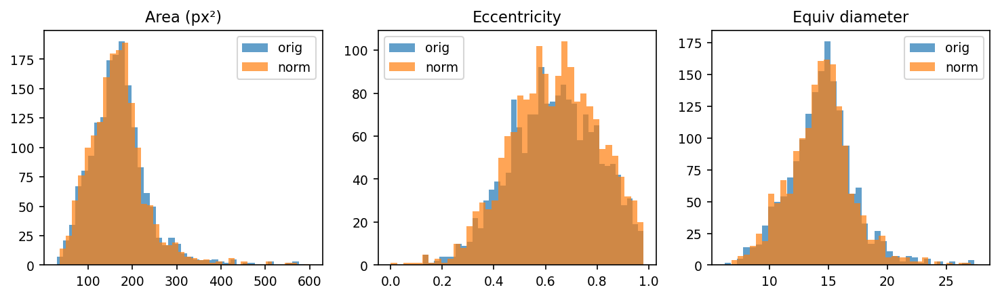

In [ ]:
# Solution
fig, axs = plt.subplots(1, 3, figsize=(12, 3))

axs[0].hist(df_feat["area_px2"], bins=40, alpha=0.7, label="orig")
axs[0].hist(df_feat_norm["area_px2"], bins=40, alpha=0.7, label="norm")
axs[0].set_title("Area (px²)"); axs[0].legend()

axs[1].hist(df_feat["eccentricity"], bins=40, alpha=0.7, label="orig")
axs[1].hist(df_feat_norm["eccentricity"], bins=40, alpha=0.7, label="norm")
axs[1].set_title("Eccentricity"); axs[1].legend()

axs[2].hist(df_feat["equiv_diameter"], bins=40, alpha=0.7, label="orig")
axs[2].hist(df_feat_norm["equiv_diameter"], bins=40, alpha=0.7, label="norm")
axs[2].set_title("Equiv diameter"); axs[2].legend()

plt.show()

### Exercise

Using Pandas' `groupby()` function, summarise the features variability by nucleus type (notice `inst_dict_to_features()` has a "type" column). Do you see any significant difference?

You don't necessarily need to use `groupby()` to calculate the mean and standard deviation of area, eccentricity, diameter for each type, but this will make your code much cleaner.


**Tip:** You will have to use the `df_feat` variable, as well as the equivalent one for the normalised ROI.

In [ ]:
# TODO: groupby summaries before and after normalisation here.

In [ ]:
# Solution
def summarise(df):
    return df.groupby("type")[["area_px2", "eccentricity", "equiv_diameter"]].agg(["mean", "std", "count"])

display(summarise(df_feat))
display(summarise(df_feat_norm))

area_px2                  eccentricity                 equiv_diameter  \
            mean        std count         mean       std count           mean   
type                                                                            
0      80.000000  27.319657    12     0.779347  0.151799    12       9.960112   
1     177.035928  64.465769  1336     0.607458  0.155643  1336      14.788456   
2     146.600000  59.343196   135     0.614210  0.138667   135      13.406211   
3     175.661871  97.516966   139     0.851302  0.116094   139      14.458531   
4      93.516129  33.323424    62     0.713081  0.172349    62      10.734969   
5     170.545455  51.445823    11     0.688754  0.139770    11      14.562609   

                      
           std count  
type                  
0     1.701977    12  
1     2.591477  1336  
2     2.642377   135  
3     3.836194   139  
4     1.972727    62  
5     2.362883    11

area_px2                  eccentricity                 equiv_diameter  \
            mean        std count         mean       std count           mean   
type                                                                            
0      75.214286  28.807527    14     0.698755  0.171975    14       9.642121   
1     175.280553  61.771942  1301     0.607277  0.156284  1301      14.727920   
2     147.492308  57.190318   130     0.613599  0.132160   130      13.464520   
3     172.422078  95.019763   154     0.856201  0.110536   154      14.339395   
4     105.273684  38.447378    95     0.682858  0.163959    95      11.378569   
5     175.375000  34.846346     8     0.606251  0.188908     8      14.869144   

                      
           std count  
type                  
0     1.735031    14  
1     2.503463  1301  
2     2.559320   130  
3     3.742633   154  
4     2.148340    95  
5     1.586706     8